# CRLD observability flow grids — the full matrix

Each **grid** is six panels = the six ways Agent-1's observation can be degraded
(**full / self-aware / non-self-aware / cooperation-tracking / defection-tracking /
blind**). Each **panel** is a CRLD *flow field* (coloured arrows = where the
learning rule pushes the joint policy at every point) with two purple learning
trajectories, drawn in the state where both agents just cooperated.

We sweep three axes:
- **Game** — the four distinct 2x2 social dilemmas (Prisoner's Dilemma, Harmony,
  Stag Hunt, Snowdrift/Chicken) plus the coin_game reduction, all at **N=2** (these
  are inherently two-player). The **arena** is the *N-player* social dilemma, shown
  at **N=2, 3, 4** — the many-player analysis lives here, not on the 2-player games.
- **Algorithm** — CRLD actor-critic (policy gradient, the analytic limit of *both*
  IPPO and A2C) vs CRLD SARSA (value-based, the analytic limit of IQL).
- **Players** — for N>2 the grid is a 2-D projection onto agents 0,1 (averaging over
  the rest), so it gets noisier with N; N=4 is at the limit of what the projection
  can show (SARSA N=4 fails numerically).

How to read it: arrows pointing into a corner = the learning dynamics drive the
joint policy there. (0,0) = mutual defection, (1,1) = mutual cooperation.

In [1]:
import os, glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import image as mpimg
plt.rcParams.update({"figure.dpi": 130})
RESULTS = os.path.join(os.getcwd(), "results")

def show(fname, title, figsize=(13, 8)):
    p = os.path.join(RESULTS, fname)
    if not os.path.exists(p):
        print("(not generated yet:", fname, ")"); return
    fig, ax = plt.subplots(figsize=figsize); ax.imshow(mpimg.imread(p)); ax.axis("off")
    ax.set_title(title, fontsize=11, loc="left", color="#114"); plt.show()


## Prisoner's Dilemma (IPD)

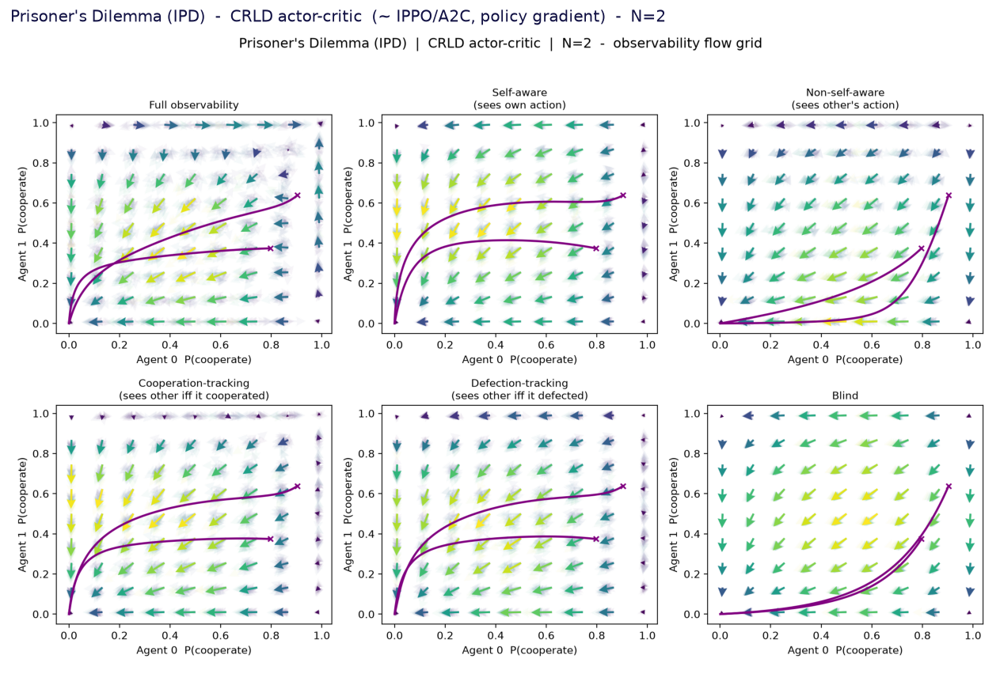

In [2]:
show('obsgrid_ipd_ac_N2.png', "Prisoner's Dilemma (IPD)  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=2")

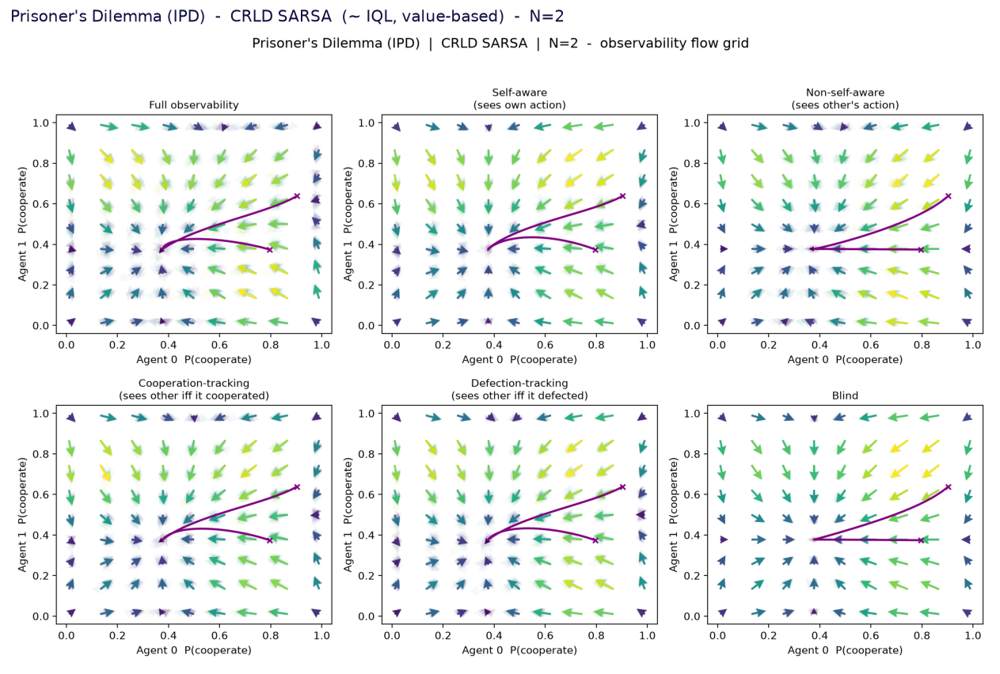

In [3]:
show('obsgrid_ipd_sarsa_N2.png', "Prisoner's Dilemma (IPD)  -  CRLD SARSA  (~ IQL, value-based)  -  N=2")

## Harmony

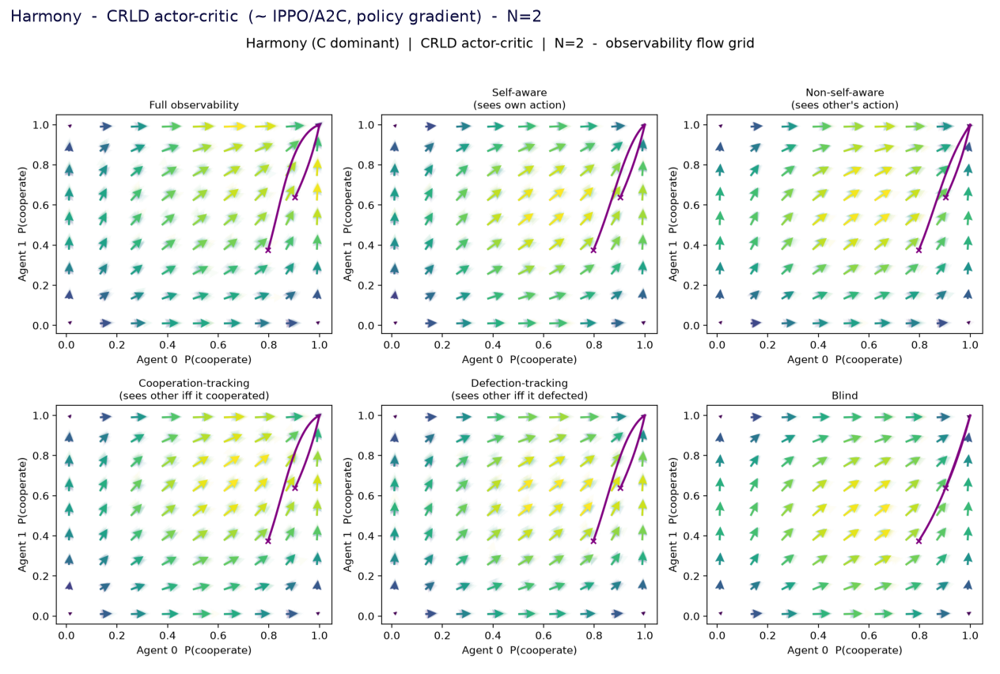

In [4]:
show('obsgrid_harmony_ac_N2.png', 'Harmony  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=2')

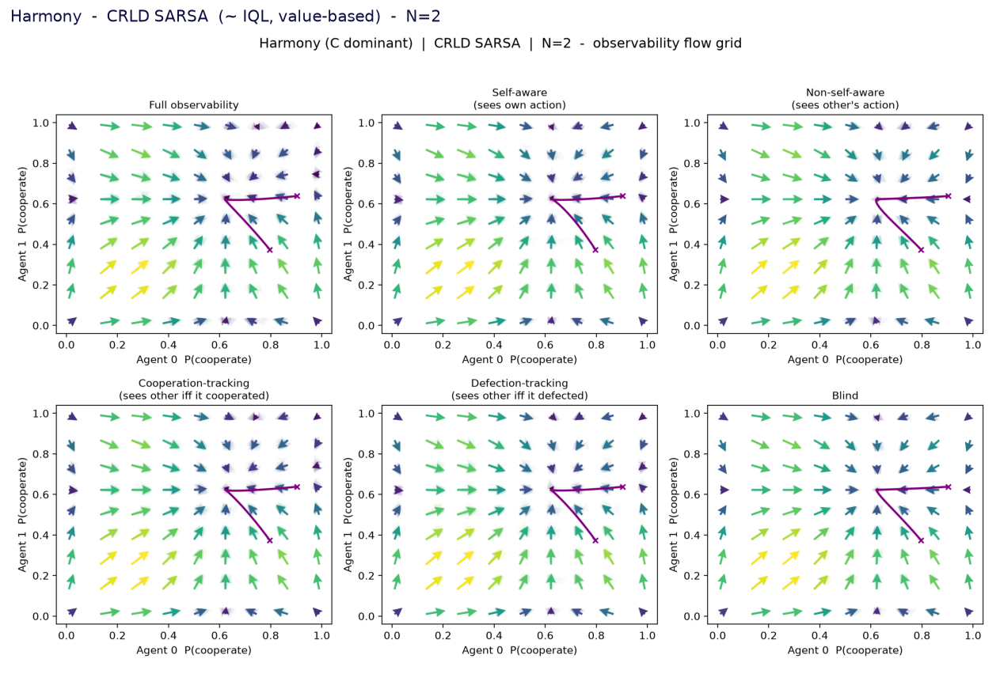

In [5]:
show('obsgrid_harmony_sarsa_N2.png', 'Harmony  -  CRLD SARSA  (~ IQL, value-based)  -  N=2')

## Stag Hunt

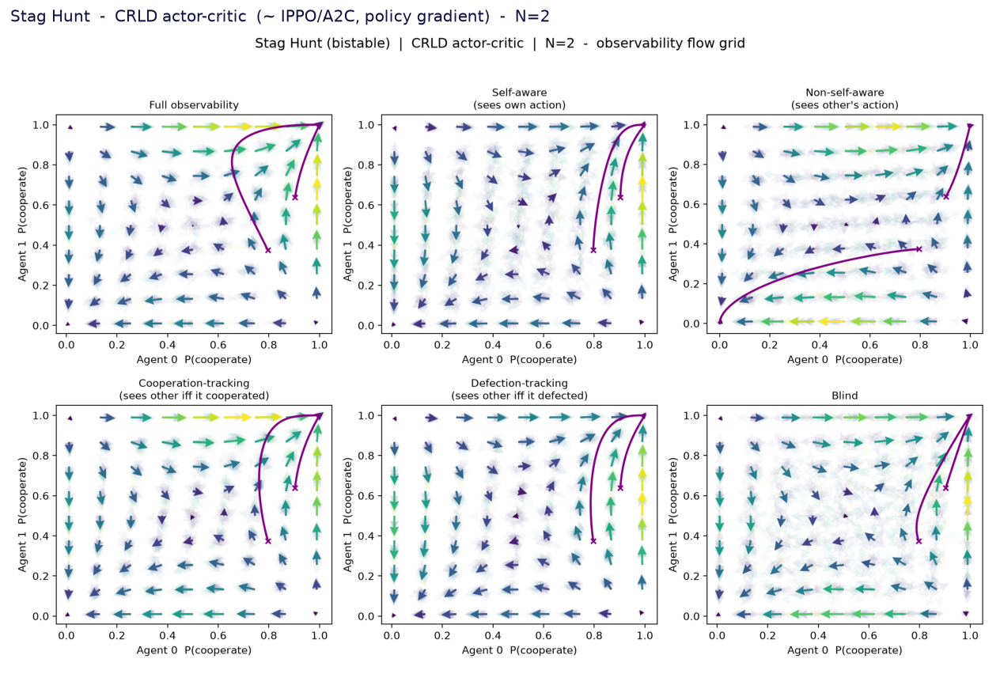

In [6]:
show('obsgrid_staghunt_ac_N2.png', 'Stag Hunt  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=2')

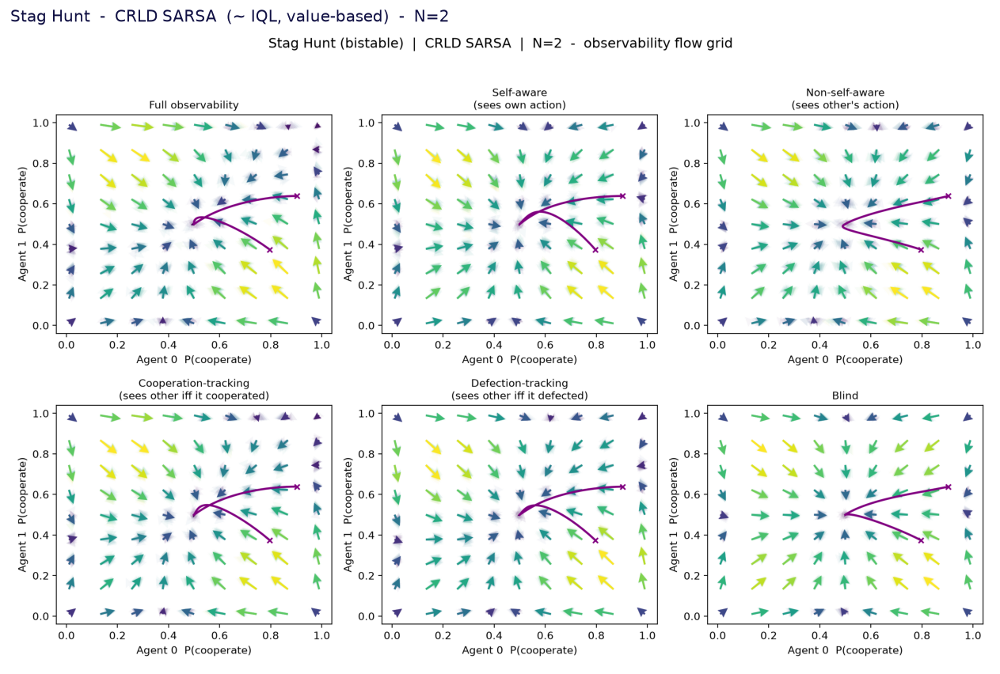

In [7]:
show('obsgrid_staghunt_sarsa_N2.png', 'Stag Hunt  -  CRLD SARSA  (~ IQL, value-based)  -  N=2')

## Snowdrift / Chicken

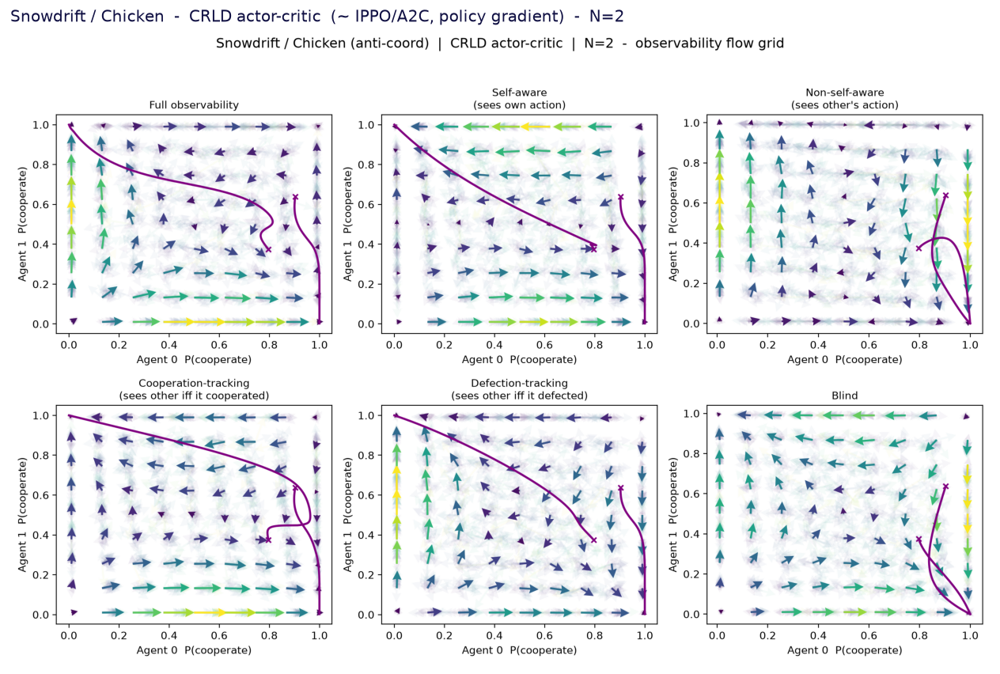

In [8]:
show('obsgrid_snowdrift_ac_N2.png', 'Snowdrift / Chicken  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=2')

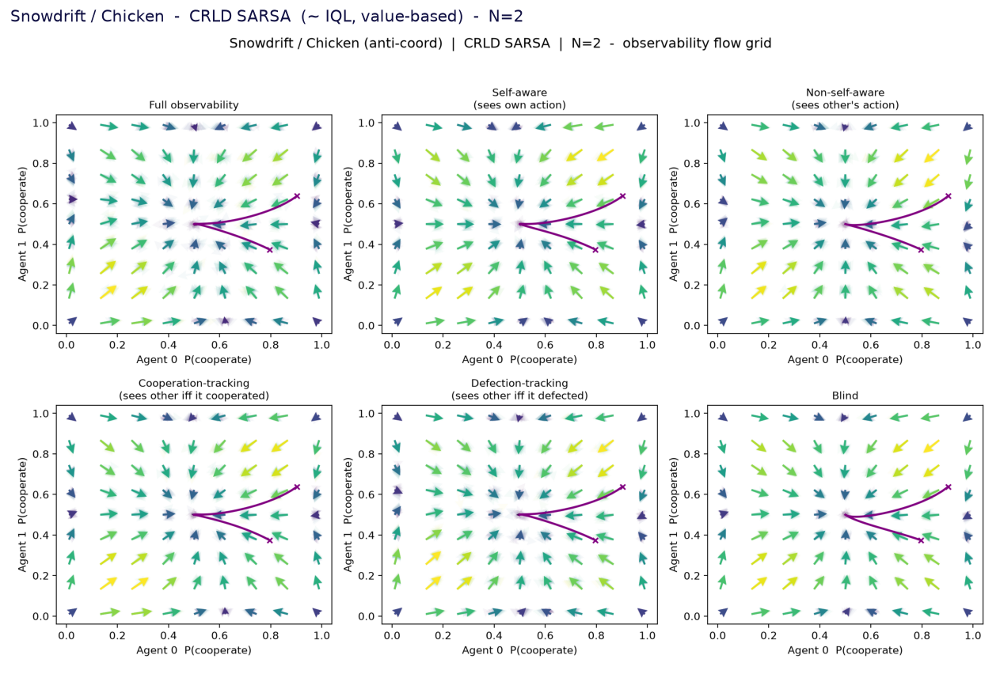

In [9]:
show('obsgrid_snowdrift_sarsa_N2.png', 'Snowdrift / Chicken  -  CRLD SARSA  (~ IQL, value-based)  -  N=2')

## coin_game (Prisoner's Dilemma reduction)

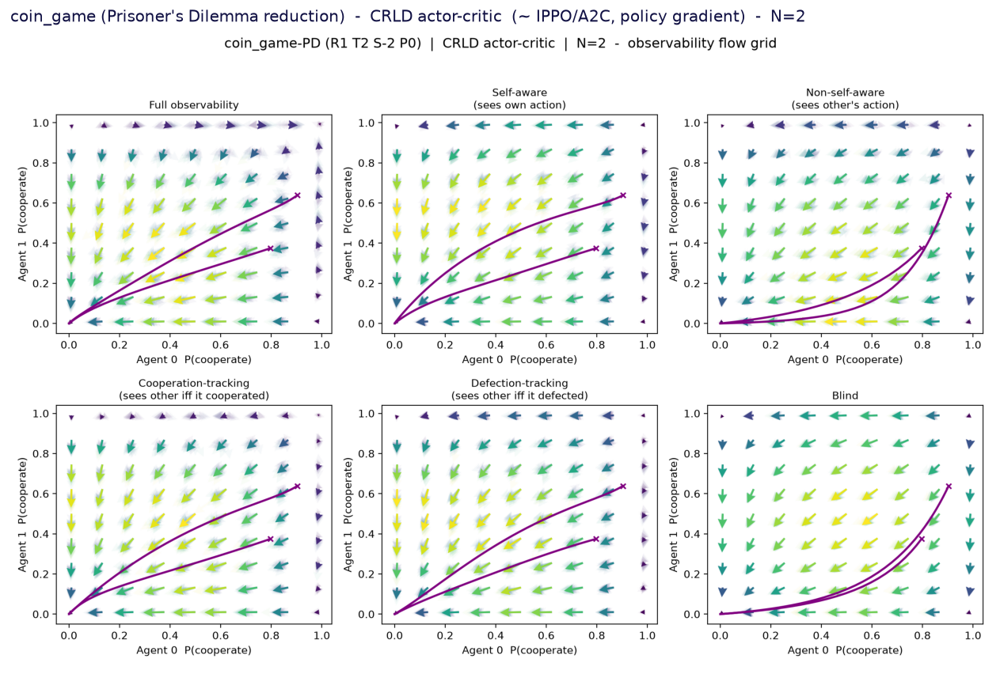

In [10]:
show('obsgrid_coin_ac_N2.png', "coin_game (Prisoner's Dilemma reduction)  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=2")

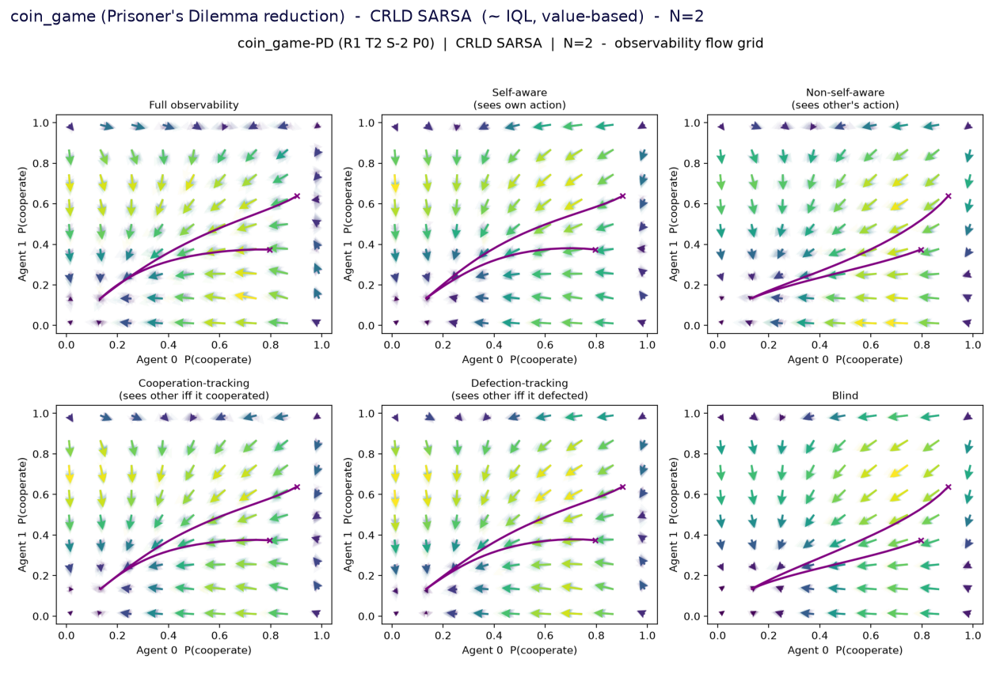

In [11]:
show('obsgrid_coin_sarsa_N2.png', "coin_game (Prisoner's Dilemma reduction)  -  CRLD SARSA  (~ IQL, value-based)  -  N=2")

## STORM arena (N-player social dilemma)

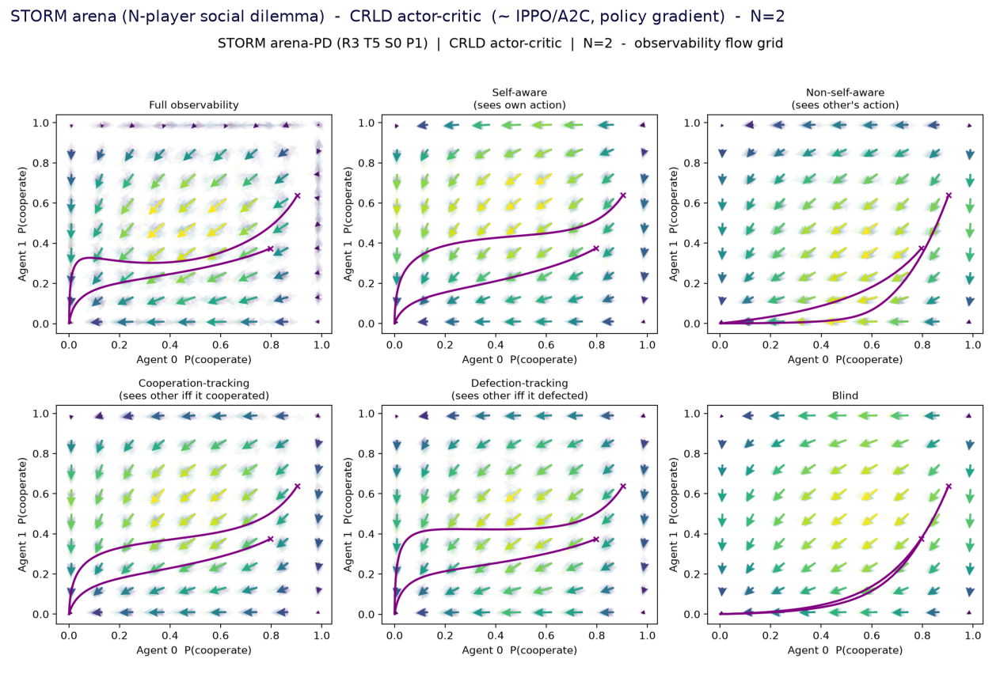

In [12]:
show('obsgrid_arena_ac_N2.png', 'STORM arena (N-player social dilemma)  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=2')

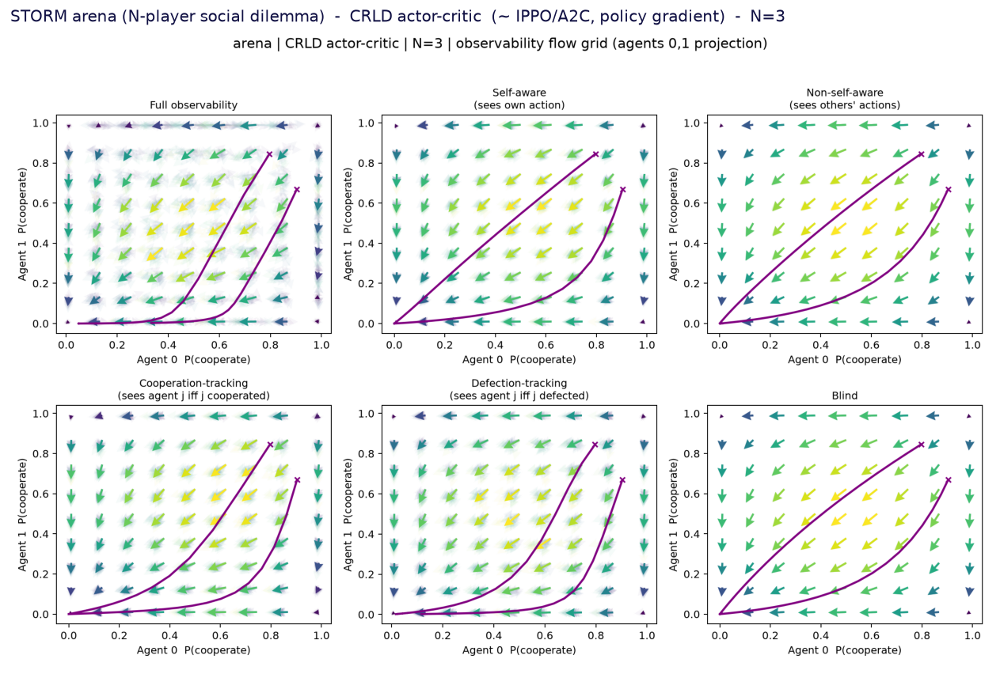

In [13]:
show('obsgrid_arena_ac_N3.png', 'STORM arena (N-player social dilemma)  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=3')

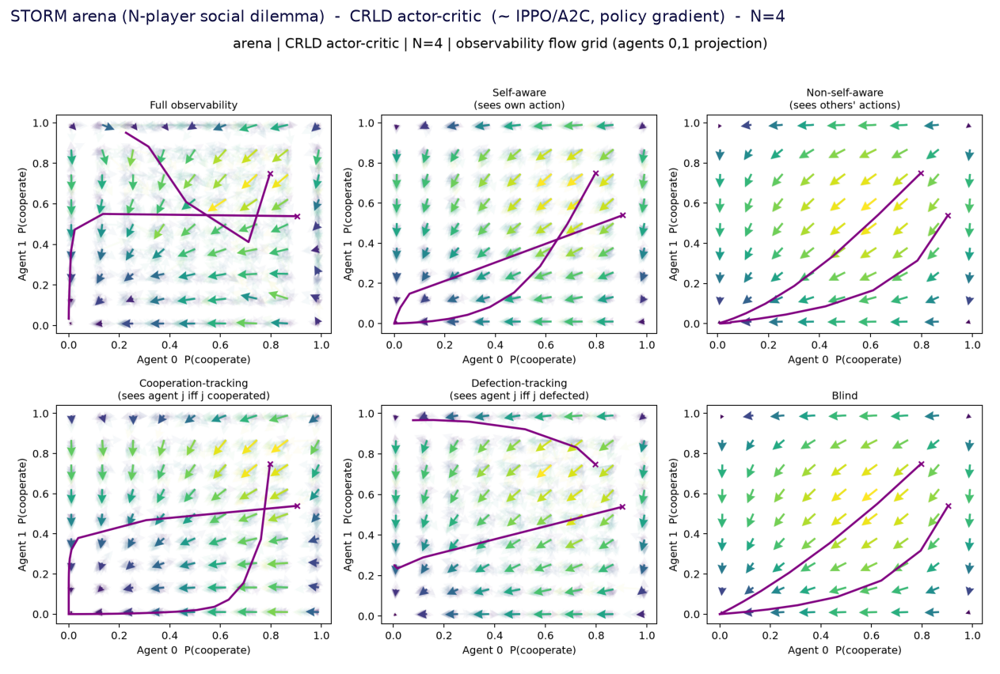

In [14]:
show('obsgrid_arena_ac_N4.png', 'STORM arena (N-player social dilemma)  -  CRLD actor-critic  (~ IPPO/A2C, policy gradient)  -  N=4')

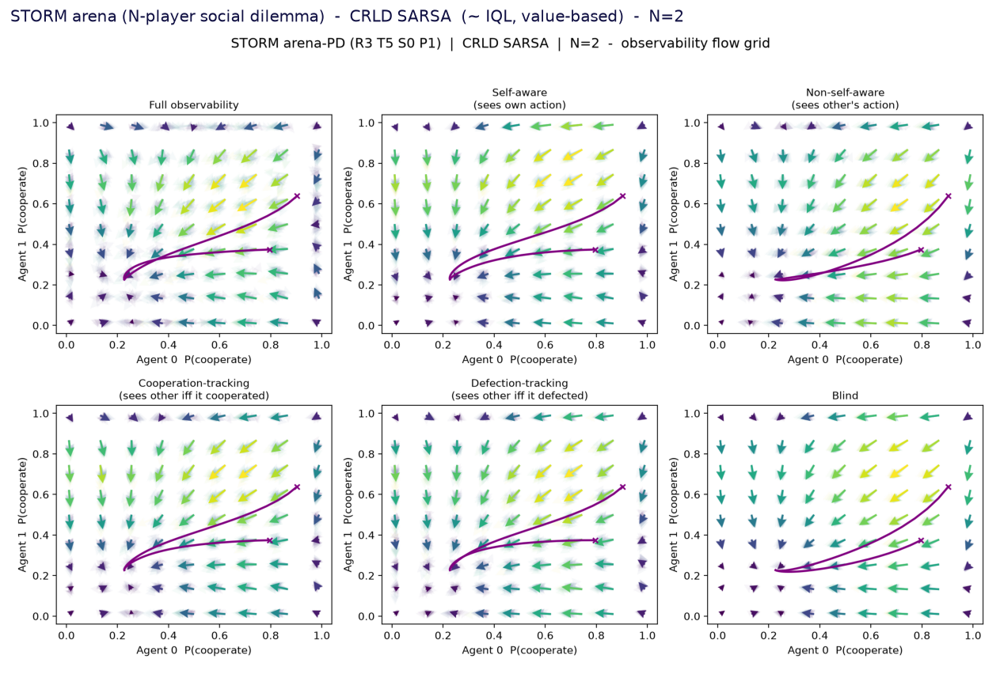

In [15]:
show('obsgrid_arena_sarsa_N2.png', 'STORM arena (N-player social dilemma)  -  CRLD SARSA  (~ IQL, value-based)  -  N=2')

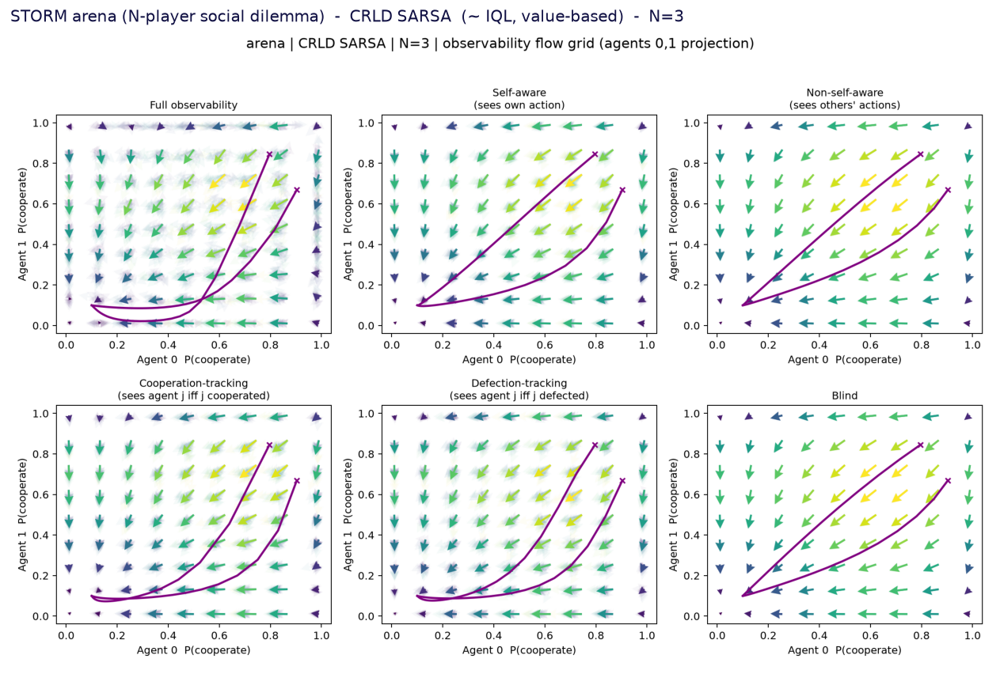

In [16]:
show('obsgrid_arena_sarsa_N3.png', 'STORM arena (N-player social dilemma)  -  CRLD SARSA  (~ IQL, value-based)  -  N=3')

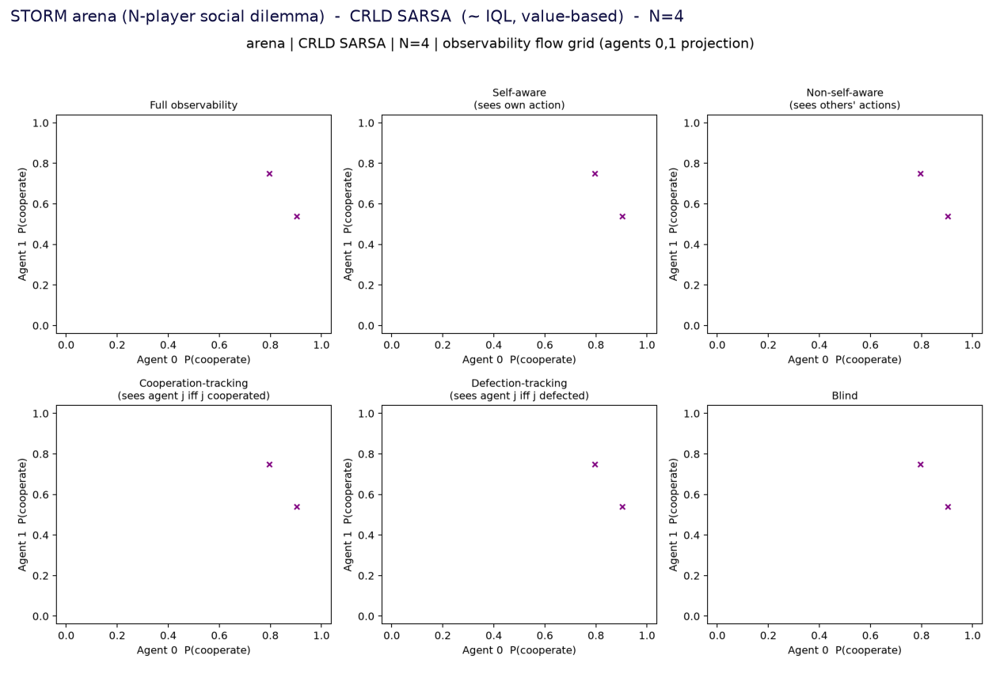

In [17]:
show('obsgrid_arena_sarsa_N4.png', 'STORM arena (N-player social dilemma)  -  CRLD SARSA  (~ IQL, value-based)  -  N=4')

## Key findings & honest caveats

**Cooperation vs number of players (a surprise) — the arena / N-player dilemma.**
In the *pairwise-averaged* N-player social dilemma, cooperation does **not** get
harder with more players — for the Prisoner's Dilemma it gets *easier*: from random
starts, cooperation at the reciprocity state rises with N (numbers below are for
the canonical PD/Stag-Hunt/Snowdrift payoffs, illustrating the mechanism).

| game (full obs, P(C) at reciprocity state) | N=2 | N=3 | N=4 |
|---|---|---|---|
| Prisoner's Dilemma | 0.00 | 0.09 | 0.23 |
| Stag Hunt | 0.83 | 0.72 | 0.84 |
| Snowdrift | 0.50 | 0.54 | 0.50 |

Why: a single agent's defection only perturbs *one* of the N−1 pairwise terms, so
the pull away from mutual cooperation shrinks relative to the reciprocity
structure, enlarging the cooperative basin. The naive "more players → less
cooperation" intuition comes from non-reciprocal / public-goods framings; under
memory-1 reciprocity with payoff dilution it goes the other way.

- **Actor-critic vs SARSA:** the flow field depends on the *learning rule*. On the
  IPD, actor-critic flows to defection while SARSA (value-based) sustains more
  cooperation — the analytic twin of the deep-RL "IPPO defects, IQL cooperates".
- **Players (N>2):** the panels are a 2-D projection (agents 0,1, averaging over the
  rest), so they read as "the dynamics for a representative pair". Cooperation
  generally gets harder as N grows.
- **Regimes for N>2:** *self / others / full / blind* generalize directly; the
  conditional *cooperation/defection-tracking* regimes are 2-player constructs
  (they condition on "the other" agent), so for N>2 they use the documented
  N-generalisation (see `scratch_repro/nplayer_obs.py`) or are omitted.
- Any "(not generated yet)" cell means that (game x algorithm x N) combination is
  still computing or was not feasible — re-run after the generators finish.